In [93]:
import pandas as pd
import numpy as np
import json

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [48]:
bild_df = pd.read_table("data/bildstein_station1_xyz_intensity_rgb/bildstein_station1_xyz_intensity_rgb.txt", sep=" ", header=None)
bild_df.columns=["x", "y", "z", "intensity", "r", "g", "b"]
bild_df['label'] = pd.read_table("data/sem8_labels_training/sem8_labels_training/bildstein_station1_xyz_intensity_rgb.labels", header=None)
bild_df.describe().round(2)

,x,y,z,intensity,r,g,b,label
count,29697591.00,29697591.00,29697591.00,29697591.00,29697591.00,29697591.00,29697591.00,29697591.00
mean,1.35,1.75,-0.48,-1112.64,102.13,103.65,101.95,0.93
std,10.79,10.71,3.13,387.08,43.96,45.82,47.05,1.61
min,-104.70,-133.53,-17.11,-1766.00,0.00,0.00,0.00,0.00
25%,-1.78,-2.03,-1.86,-1365.00,72.00,71.00,70.00,0.00
50%,0.24,-0.64,-1.40,-1199.00,104.00,105.00,98.00,0.00
75%,2.77,3.34,0.46,-1062.00,129.00,131.00,128.00,2.00
max,120.58,112.86,47.37,2043.00,255.00,255.00,255.00,8.00


In [94]:
with open("labels.json") as f:
    LABELS = json.load(f)

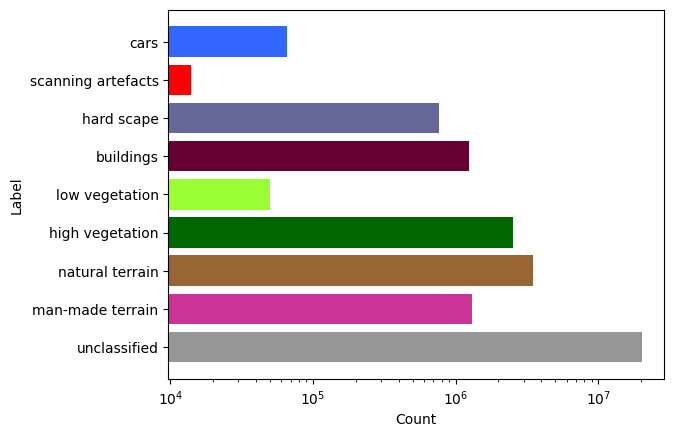

In [95]:
label_counts = bild_df['label'].value_counts()
plt.barh(label_counts.index, label_counts, color=[LABELS[i]['color'] for i in label_counts.index])
plt.yticks(label_counts.index, [LABELS[i]['name'] for i in label_counts.index])
plt.ylabel("Label")
plt.xlabel("Count")
plt.xscale("log")
plt.show()

In [83]:
colormap = {str(i): LABELS[i]['color'] for i in range(9)}

In [98]:
sample_df = bild_df[bild_df['label'] != 0].sample(100000)
sample_df['label'] = sample_df['label'].astype(str)
fig = px.scatter_3d(sample_df, x='x', y='y', z='z', color='label', color_discrete_map=colormap)

fig.update_layout(scene=dict(aspectmode='data'))
fig.update_traces(marker=dict(size=2))

fig.show()

In [99]:
fig = px.scatter_3d(sample_df, x='x', y='y', z='z')

fig.update_layout(scene=dict(aspectmode='data'))
fig.update_traces(marker=dict(size=2, color=sample_df.apply(lambda row: f"rgb({row['r']}, {row['g']}, {row['b']})", axis=1)))

fig.show()

In [101]:
fig = px.scatter_3d(sample_df, x='x', y='y', z='z', color='intensity')

fig.update_layout(scene=dict(aspectmode='data'))
fig.update_traces(marker=dict(size=2))

fig.show()